# FIFA 21 Player Dataset Cleaning
## FIFA 21 球员表 数据清理

content：adjust column name，reset correct data type，delete unuseful information. to make the whole dataset more precise and clean
主要内容：修改列名，修改数据类型，修改具体数据的格式等使其更美观。

import packages.import data file

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [18]:
df = pd.read_csv('fifa21 raw data v2.csv')
pd.set_option('display.max_columns',1000) #to inspect more columns.方便观察整张表
pd.set_option('display.max_rows', None) #to inspect more rows.方便观察整张表

C:\Users\54396\AppData\Local\Temp\ipykernel_11680\3514656170.py:1: DtypeWarning: Columns (76) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('fifa21 raw data v2.csv')


In [19]:
# adjust column name(personal habit)
df.columns = df.columns.str.replace(' ','_')
df.columns = df.columns.str.replace('↓','')

In [92]:
df = df.rename(columns={'OVA':'Overall_desc'})

data cleaning. Remove strings '\n\n\n\n' from column club. 将club这一列中前面部分的字符串删去

In [ ]:
df['Club'] = df['Club'].str.replace('\n\n\n\n','')

In [ ]:
remove unneeded columns.删去不需要的列

In [20]:
drop_columns = ['photoUrl','playerUrl','Loan_Date_End']
df = df.drop(columns = drop_columns)

column Weight and column Height have the same issue that contains values in both centimeters and feet/inches or both pounds and kilograms
convert all feet/inches/pounds to cm/kg
在Weight跟Height列中的数据单位不统一，Height中身高既有厘米制又有英尺，Weight中情况一样，需将他们的单位统一

In [22]:
for i in range(len(df)):
    Height = df.loc[i,'Height']
    if '\'' in Height:
        feet,inches = Height.split('\'')
        inches = inches.replace('"','')
        feet= int(feet)
        inches = int(inches)
        cm = feet * 30.48 + inches * 2.54
        df.loc[i,'Height'] = cm
    elif 'cm' in Height:
        cm = float(Height.replace('cm',''))
        df.loc[i,'Height']= cm

In [23]:
df['Height'] = df['Height'].astype(float)

In [9]:
#Weight column did have the same issue
lbs_rows = df[df['Weight'].str.contains('lbs')]
lbs_rows

,ID,Name,LongName,Nationality,Age,OVA,POT,Club,Contract,Positions,Height,Weight,Preferred_Foot,BOV,Best_Position,Joined,Value,Wage,Release_Clause,Attacking,Crossing,Finishing,Heading_Accuracy,Short_Passing,Volleys,Skill,Dribbling,Curve,FK_Accuracy,Long_Passing,Ball_Control,Movement,Acceleration,Sprint_Speed,Agility,Reactions,Balance,Power,Shot_Power,Jumping,Stamina,Strength,Long_Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing_Tackle,Sliding_Tackle,Goalkeeping,GK_Diving,GK_Handling,GK_Kicking,GK_Positioning,GK_Reflexes,Total_Stats,Base_Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits
793,110677,Moyá,Miguel Ángel Moyá Rumbo,Spain,36,78,78,\n\n\n\nReal Sociedad,2018 ~ 2021,GK,187.96,183lbs,Right,78,GK,"Feb 27, 2018",€1.7M,€15K,€3.6M,78,11,11,12,31,13,100,13,16,12,35,24,257,46,34,54,74,49,225,60,62,30,57,16,122,22,11,10,68,11,60,43,15,14,14,391,82,72,80,79,78,1216,430,2 ★,1★,Medium,Medium,2 ★,82,72,80,78,39,79,14
847,166706,M. Škrtel,Martin Škrtel,Slovakia,35,78,78,\n\n\n\nMedipol Başakşehir FK,2020 ~ 2021,CB,190.50,179lbs,Right,78,CB,"Aug 20, 2020",€3.1M,€26K,€5.9M,263,39,35,83,63,43,228,46,33,27,65,57,262,40,52,47,71,52,310,46,73,67,89,35,260,84,76,33,28,39,70,233,77,79,77,44,15,5,7,6,11,1600,344,2 ★,2★,Medium,High,3 ★,47,38,48,51,78,82,22
848,189068,B. Dost,Bas Dost,Netherlands,31,78,78,\n\n\n\nEintracht Frankfurt,2019 ~ 2022,ST,195.58,183lbs,Right,78,ST,"Aug 26, 2019",€9.5M,€33K,€16.2M,369,38,84,92,73,82,269,66,61,30,37,75,240,43,50,34,81,32,355,81,49,65,91,69,360,75,39,87,69,90,81,129,38,65,26,52,6,12,15,11,8,1774,380,3 ★,2★,Medium,Medium,3 ★,47,81,57,65,51,79,33
860,198031,Sérgio Oliveira,Sérgio Miguel Relvas de Oliveira,Portugal,28,78,78,\n\n\n\nFC Porto,2015 ~ 2021,CM,180.34,172lbs,Right,78,CM,"Jul 1, 2015",€10.5M,€16K,€21M,375,80,69,64,84,78,392,76,76,80,82,78,330,62,55,68,78,67,367,88,56,72,65,86,367,72,66,70,80,79,76,186,71,67,48,50,9,9,11,11,10,2067,426,3 ★,3★,Medium,High,1 ★,58,77,82,75,66,68,41
861,190243,M. Hitz,Marwin Hitz,Switzerland,32,78,78,\n\n\n\nBorussia Dortmund,2018 ~ 2021,GK,193.04,196lbs,Right,78,GK,"Jul 1, 2018",€6.5M,€39K,€11.1M,112,12,27,18,29,26,95,13,15,17,33,17,231,41,46,41,72,31,242,47,67,38,78,12,103,25,23,8,25,22,44,42,13,15,14,378,79,77,63,79,80,1203,422,3 ★,1★,Medium,Medium,2 ★,79,77,63,80,44,79,17
862,194222,Laguardia,Víctor Laguardia Cisneros,Spain,30,78,78,\n\n\n\nDeportivo Alavés,2014 ~ 2022,CB,185.42,176lbs,Right,78,CB,"Jul 11, 2014",€8.5M,€25K,€17.9M,265,43,49,74,70,29,240,42,38,35,62,63,278,46,55,44,76,57,314,57,76,71,77,33,299,89,80,44,46,40,71,238,82,80,76,58,14,12,13,9,10,1692,361,3 ★,2★,Medium,High,1 ★,51,46,55,51,80,78,3
863,194209,Y. El Arabi,Youssef El Arabi,Morocco,33,78,78,\n\n\n\nOlympiacos CFP,2019 ~ 2021,ST,182.88,185lbs,Right,78,ST,"Jul 6, 2019",€6.5M,€500,€13.7M,375,61,84,76,69,85,366,78,72,74,62,80,356,75,68,82,74,57,372,78,71,69,78,76,334,51,44,81,72,86,72,97,25,30,42,50,6,16,11,6,11,1950,404,4 ★,3★,High,Medium,2 ★,71,81,67,78,37,70,8
864,193601,G. Pezzella,Germán Pezzella,Argentina,29,78,78,\n\n\n\nFiorentina,2018 ~ 2022,CB,185.42,179lbs,Right,78,CB,"Jul 1, 2018",€8.5M,€50K,€14.5M,274,40,48,82,64,40,247,54,46,25,56,66,266,55,53,33,77,48,321,54,82,57,78,50,266,82,80,47,22,35,72,238,78,82,78,54,7,9,13,10,15,1666,360,3 ★,2★,Medium,Medium,1 ★,54,49,47,56,80,74,20
865,193352,R. Rodríguez,Ricardo Rodríguez,Switzerland,27,78,78,\n\n\n\nTorino,2020 ~ 2024,LB,180.34,170lbs,Left,78,LB,"Aug 19, 2020",€9M,€41K,€15.3M,346,82,58,64,76,66,388,74,80,82,76,76,357,68,74,71,74,70,372,78,73,75,74,72,366,74,80,64,68,80,80,233,78,78,77,66,14,13,14,14,11,2128,439,3 ★,3★,Medium,Medium,3 ★,71,67,76,74,77,74,36
866,193152,Herrerín,Iago Herrerín Buisán,Spain,32,78,78,\n\n\n\nAthletic Club de Bilbao,2012 ~ 2021,GK,187.96,196lbs,Right,78,GK,"Jul 1, 2012",€6.5M,€19K,€13.7M,72,14,13,14,16,15,87,19,15,12,29,12,265,48,39,49,74,55,267,62,67,42,80,16,141,37,23,16,40,25,58,44,16,16,12,392,80,78,83,77,74,1268,435,3 ★,1★,Medium,Medium,1 ★,80,78,8

In [24]:
for i in range(len(df)):
    Weight = df.loc[i,'Weight']
    if 'lbs' in Weight:
        weight_in_kg = float(Weight.replace('lbs','')) * 0.453592
        df.loc[i,'Weight'] = weight_in_kg
    elif 'kg' in Weight:
        Weight = float(Weight.replace('kg',''))
        df.loc[i,'Weight'] = Weight 

In [25]:
df['Weight'] = df['Weight'].astype(float)

noticed that column 'Joined' is an object type,split it into year, month, and day. and merge into one datetime column
Joined表的数据类型是object，先将其分为年，月，日三个列再合并为一个日期格式的列

In [32]:
df['Joined']

0         Jul 1, 2004
1        Jul 10, 2018
2        Jul 16, 2014
3        Aug 30, 2015
4         Aug 3, 2017
5         Jul 1, 2014
6         Jul 1, 2017
7        Jul 19, 2018
8         Jul 1, 2018
9         Jul 1, 2014
10        Jan 1, 2018
11        Jul 1, 2016
12       Jul 11, 2013
13        Aug 9, 2018
14        Jul 1, 2011
15        Jul 9, 2009
16        Aug 1, 2005
17       Jul 28, 2011
18       Jul 14, 2015
19       Jul 16, 2016
20        Jul 1, 2015
21        Jul 1, 2015
22        Jul 1, 2017
23        Jul 1, 2010
24        Jul 1, 2012
25        Jul 1, 2014
26        Jul 1, 2019
27       Jul 17, 2014
28       Jul 12, 2019
29       Aug 31, 2017
30        Oct 7, 2015
31        Jul 1, 2017
32       Jul 21, 2017
33       Jan 30, 2018
34       Jan 30, 2020
35        Jul 1, 2018
36       Aug 28, 2015
37        Jul 6, 2015
38        Sep 2, 2019
39        Jul 1, 2005
40        Sep 1, 2008
41       Jan 31, 2018
42       Jul 19, 2017
43        Aug 6, 2015
44        Aug 1, 2012
45       S

In [37]:
df[['month','day','year']]=df['Joined'].str.split(' ',expand=True)

In [39]:
df['day']= df['day'].str.rstrip(',')

In [43]:
df['month']

0        Jul
1        Jul
2        Jul
3        Aug
4        Aug
5        Jul
6        Jul
7        Jul
8        Jul
9        Jul
10       Jan
11       Jul
12       Jul
13       Aug
14       Jul
15       Jul
16       Aug
17       Jul
18       Jul
19       Jul
20       Jul
21       Jul
22       Jul
23       Jul
24       Jul
25       Jul
26       Jul
27       Jul
28       Jul
29       Aug
30       Oct
31       Jul
32       Jul
33       Jan
34       Jan
35       Jul
36       Aug
37       Jul
38       Sep
39       Jul
40       Sep
41       Jan
42       Jul
43       Aug
44       Aug
45       Sep
46       Aug
47       Jul
48       Aug
49       Jul
50       Jul
51       Jul
52       Jul
53       Aug
54       May
55       Jul
56       Jul
57       Jul
58       Aug
59       Sep
60       Jul
61       Jun
62       Jul
63       Aug
64       Jan
65       Sep
66       Jul
67       Jul
68       Jul
69       Jul
70       Jul
71       Jul
72       Jul
73       Jul
74       Jul
75       Jul
76       Jun

Define a function to convert month names to numbers
将字符串形式表示的月份用数字代替

In [44]:
def convert_month(month):
    month_dict = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
                  'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}
    return month_dict[month]
    

In [45]:
df['month']=df['month'].apply(convert_month) # Convert the month column to numeric values

In [46]:
df['date'] = pd.to_datetime(df[['year','month','day']]) # Split the 'joined' column into year, month, and day columns

In [47]:
df['date']

0       2004-07-01
1       2018-07-10
2       2014-07-16
3       2015-08-30
4       2017-08-03
5       2014-07-01
6       2017-07-01
7       2018-07-19
8       2018-07-01
9       2014-07-01
10      2018-01-01
11      2016-07-01
12      2013-07-11
13      2018-08-09
14      2011-07-01
15      2009-07-09
16      2005-08-01
17      2011-07-28
18      2015-07-14
19      2016-07-16
20      2015-07-01
21      2015-07-01
22      2017-07-01
23      2010-07-01
24      2012-07-01
25      2014-07-01
26      2019-07-01
27      2014-07-17
28      2019-07-12
29      2017-08-31
30      2015-10-07
31      2017-07-01
32      2017-07-21
33      2018-01-30
34      2020-01-30
35      2018-07-01
36      2015-08-28
37      2015-07-06
38      2019-09-02
39      2005-07-01
40      2008-09-01
41      2018-01-31
42      2017-07-19
43      2015-08-06
44      2012-08-01
45      2020-09-25
46      2012-08-31
47      2016-07-27
48      2008-08-10
49      2011-07-01
50      2013-07-05
51      2011-07-01
52      2012

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18979 entries, 0 to 18978
Data columns (total 78 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID                18979 non-null  int64         
 1   Name              18979 non-null  object        
 2   LongName          18979 non-null  object        
 3   Nationality       18979 non-null  object        
 4   Age               18979 non-null  int64         
 5   OVA               18979 non-null  int64         
 6   POT               18979 non-null  int64         
 7   Club              18979 non-null  object        
 8   Contract          18979 non-null  object        
 9   Positions         18979 non-null  object        
 10  Height            18979 non-null  float64       
 11  Weight            18979 non-null  float64       
 12  Preferred_Foot    18979 non-null  object        
 13  BOV               18979 non-null  int64         
 14  Best_Position     1897

In [67]:
df[['Joined','date']]
#comparision.对比一下

,Joined,date
0,"Jul 1, 2004",2004-07-01
1,"Jul 10, 2018",2018-07-10
2,"Jul 16, 2014",2014-07-16
3,"Aug 30, 2015",2015-08-30
4,"Aug 3, 2017",2017-08-03
5,"Jul 1, 2014",2014-07-01
6,"Jul 1, 2017",2017-07-01
7,"Jul 19, 2018",2018-07-19
8,"Jul 1, 2018",2018-07-01
9,"Jul 1, 2014",2014-07-01


In [90]:
df.drop('Joined', axis=1, inplace=True)

noticed that in columns 'wage','value','release_clause', the unit is not consistant. these needs to be united
观察到wage，value，releaseClause中的货币单位是统一的，可以去掉不影响理解，但是计量单位既有M又有K，需要统一

In [51]:
df[['Wage','Value','Release_Clause']]

,Wage,Value,Release_Clause
0,€560K,€103.5M,€138.4M
1,€220K,€63M,€75.9M
2,€125K,€120M,€159.4M
3,€370K,€129M,€161M
4,€270K,€132M,€166.5M
5,€240K,€111M,€132M
6,€250K,€120.5M,€144.3M
7,€160K,€102M,€120.3M
8,€160K,€185.5M,€203.1M
9,€260K,€110M,€147.7M


In [58]:
new_value = []
for i in range(len(df['Value'])):
    value = df['Value'][i]
    value = value.replace('€','')
    value = value.replace('K','000')
    value = value.replace('M','000000')
    value = value.replace('.','D')
    if 'D' in value:
        value = value.replace('D','')
        value = int(value)/10
    new_value.append(int(value))
df['Value'] = new_value

In [62]:
new_wage = []
for i in range(len(df['Wage'])):
    value = df['Wage'][i]
    value = value.replace('€','')
    value = value.replace('K','000')
    value = value.replace('M','000000')
    value = value.replace('.','D')
    if 'D' in value:
        value = value.replace('D','')
        value = int(value)/10
    new_wage.append(int(value))
df['Wage'] = new_wage

In [65]:
new_RC = []
for i in range(len(df['Release_Clause'])):
    value = df['Release_Clause'][i]
    value = value.replace('€','')
    value = value.replace('K','000')
    value = value.replace('M','000000')
    value = value.replace('.','D')
    if 'D' in value:
        value = value.replace('D','')
        value = int(value)/10
    new_RC.append(int(value))
df['Release_Clause'] = new_RC

In [66]:
df[['Wage','Value','Release_Clause']]

,Wage,Value,Release_Clause
0,560000,103500000,138400000
1,220000,63000000,75900000
2,125000,120000000,159400000
3,370000,129000000,161000000
4,270000,132000000,166500000
5,240000,111000000,132000000
6,250000,120500000,144300000
7,160000,102000000,120300000
8,160000,185500000,203100000
9,260000,110000000,147700000


In [70]:
df['Hits']

0         771
1         562
2         150
3         207
4         595
5         248
6         246
7         120
8        1.6K
9         130
10        321
11        189
12        175
13         96
14        118
15        216
16        212
17        154
18        205
19        202
20        339
21        408
22        103
23        332
24         86
25        173
26        246
27        161
28        396
29       1.1K
30        433
31        242
32        206
33        177
34       1.5K
35        198
36        459
37        173
38        117
39        130
40        119
41        209
42         84
43        187
44        165
45        203
46         65
47        336
48        126
49        313
50        124
51        154
52        145
53        538
54        182
55        175
56        101
57         45
58        103
59        377
60         99
61        194
62        161
63        403
64        414
65        593
66        374
67        245
68       3.2K
69        266
70        299
71    

In [75]:
df['Hits'] = df['Hits'].fillna('0')
#accidently fill na with 0
df['Hits']

In [82]:
df['Hits'] = df['Hits'].replace(0,'0')
df['Hits'] = df['Hits'].astype(str)
#change 0 to string '0'
#change the whole column type, otherwise the following code with pop up error that float or int can not use replace

In [83]:
#same issue like in the previous cleaning process
new_hits = []
for i in range(len(df['Hits'])):
    hits = df['Hits'][i]
    hits = hits.replace('K','000')
    hits = hits.replace('.','D')
    if 'D' in hits:
        hits = hits.replace('D','')
        hits = int(hits)/10
    new_hits.append(int(hits))

In [84]:
df['Hits'] = new_hits
df['Hits']

At this point, the whole dataset is more precise and clean, which can be used for further exploration
到这一步，整张表已经变得更加简洁明了了，可用于进一步的数据分析。

In [93]:
df.head()

,ID,Name,LongName,Nationality,Age,Overall_desc,POT,Club,Contract,Positions,Height,Weight,Preferred_Foot,BOV,Best_Position,Value,Wage,Release_Clause,Attacking,Crossing,Finishing,Heading_Accuracy,Short_Passing,Volleys,Skill,Dribbling,Curve,FK_Accuracy,Long_Passing,Ball_Control,Movement,Acceleration,Sprint_Speed,Agility,Reactions,Balance,Power,Shot_Power,Jumping,Stamina,Strength,Long_Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing_Tackle,Sliding_Tackle,Goalkeeping,GK_Diving,GK_Handling,GK_Kicking,GK_Positioning,GK_Reflexes,Total_Stats,Base_Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,month,day,year,date
0,158023,L. Messi,Lionel Messi,Argentina,33,93,93,FC Barcelona,2004 ~ 2021,"RW, ST, CF",170.0,72.0,Left,93,RW,103500000,560000,138400000,429,85,95,70,91,88,470,96,93,94,91,96,451,91,80,91,94,95,389,86,68,72,69,94,347,44,40,93,95,75,96,91,32,35,24,54,6,11,15,14,8,2231,466,4 ★,4★,Medium,Low,5 ★,85,92,91,95,38,65,771,7,1,2004,2004-07-01
1,20801,Cristiano Ronaldo,C. Ronaldo dos Santos Aveiro,Portugal,35,92,92,Juventus,2018 ~ 2022,"ST, LW",187.0,83.0,Right,92,ST,63000000,220000,75900000,437,84,95,90,82,86,414,88,81,76,77,92,431,87,91,87,95,71,444,94,95,84,78,93,353,63,29,95,82,84,95,84,28,32,24,58,7,11,15,14,11,2221,464,4 ★,5★,High,Low,5 ★,89,93,81,89,35,77,562,7,10,2018,2018-07-10
2,200389,J. Oblak,Jan Oblak,Slovenia,27,91,93,Atlético Madrid,2014 ~ 2023,GK,188.0,87.0,Right,91,GK,120000000,125000,159400000,95,13,11,15,43,13,109,12,13,14,40,30,307,43,60,67,88,49,268,59,78,41,78,12,140,34,19,11,65,11,68,57,27,12,18,437,87,92,78,90,90,1413,489,3 ★,1★,Medium,Medium,3 ★,87,92,78,90,52,90,150,7,16,2014,2014-07-16
3,192985,K. De Bruyne,Kevin De Bruyne,Belgium,29,91,91,Manchester City,2015 ~ 2023,"CAM, CM",181.0,70.0,Right,91,CAM,129000000,370000,161000000,407,94,82,55,94,82,441,88,85,83,93,92,398,77,76,78,91,76,408,91,63,89,74,91,408,76,66,88,94,84,91,186,68,65,53,56,15,13,5,10,13,2304,485,5 ★,4★,High,High,4 ★,76,86,93,88,64,78,207,8,30,2015,2015-08-30
4,190871,Neymar Jr,Neymar da Silva Santos Jr.,Brazil,28,91,91,Paris Saint-Germain,2017 ~ 2022,"LW, CAM",175.0,68.0,Right,91,LW,132000000,270000,166500000,408,85,87,62,87,87,448,95,88,89,81,95,453,94,89,96,91,83,357,80,62,81,50,84,356,51,36,87,90,92,93,94,35,30,29,59,9,9,15,15,11,2175,451,5 ★,5★,High,Medium,5 ★,91,85,86,94,36,59,595,8,3,2017,2017-08-03


<Axes: xlabel='Overall_desc', ylabel='Density'>

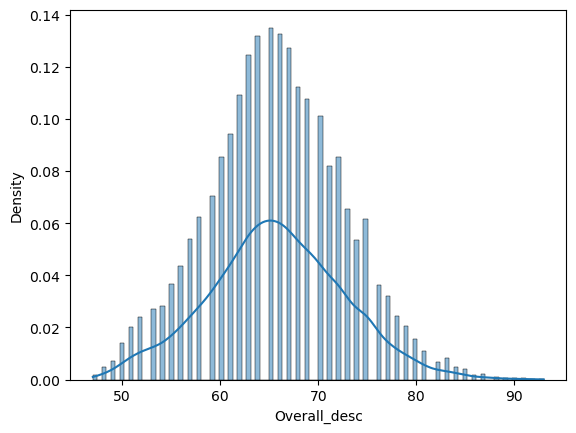

In [98]:
#FIFA21 players overall distribution. FIFA21所有球员的综合评分分布情况
sns.histplot(df['Overall_desc'],kde=True,stat='density', bins=100)

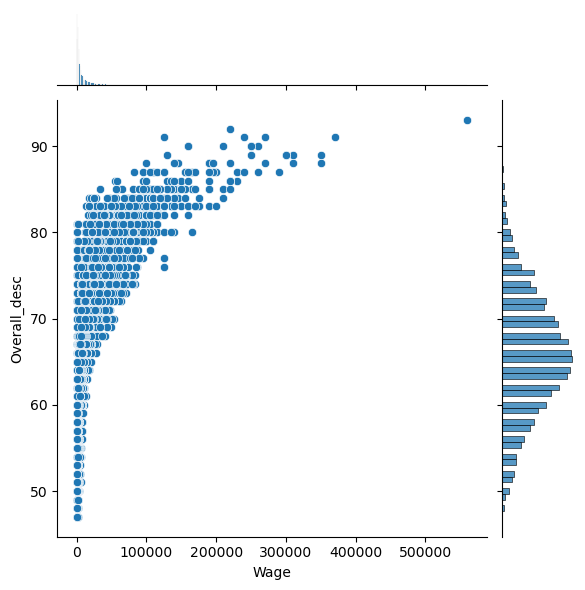

In [100]:
# we can see the subtle relationship between wage and player's ability
sns.jointplot(x='Wage',y='Overall_desc',data=df)

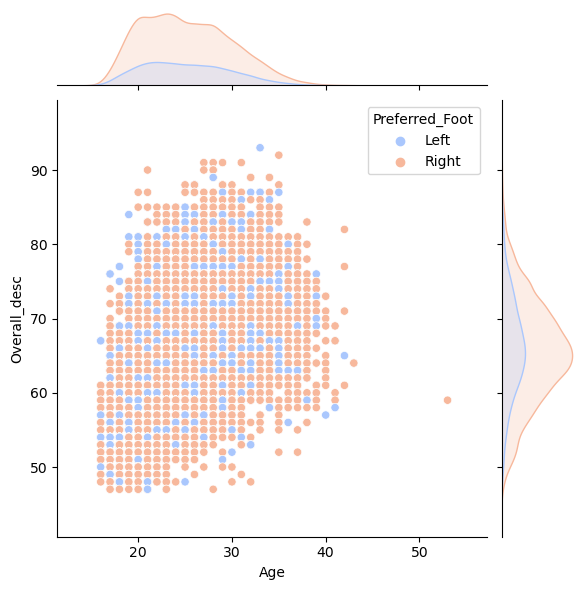

In [103]:
sns.jointplot(data=df, x='Age', y='Overall_desc', hue='Preferred_Foot',palette='coolwarm')
#There is even a dude over 50!

In [104]:
df.to_csv('cleaned_fifa_dataset.csv',index = True)